# NB: GGPlot2

## Introduction

Today we’ll look at GGPlot2, the graphics package associated with the Tidyverse.

## The Bare Miniimum

Everything starts with `ggplot()` which is part of the Tidyverse.

In [1]:
library(tidyverse)

Registered S3 methods overwritten by 'ggplot2':
  method         from 
  [.quosures     rlang
  c.quosures     rlang
  print.quosures rlang
Registered S3 method overwritten by 'rvest':
  method            from
  read_xml.response xml2
-- Attaching packages --------------------------------------- tidyverse 1.2.1 --
v ggplot2 3.1.1       v purrr   0.3.2  
v tibble  2.1.1       v dplyr   0.8.0.1
v tidyr   0.8.3       v stringr 1.4.0  
v readr   1.3.1       v forcats 0.4.0  
-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()


Here is a basic graph --- a scatterplot comparing two features in the iris dataset. 

The functions and arguments are broken out so you can see how the grammar is implemented:

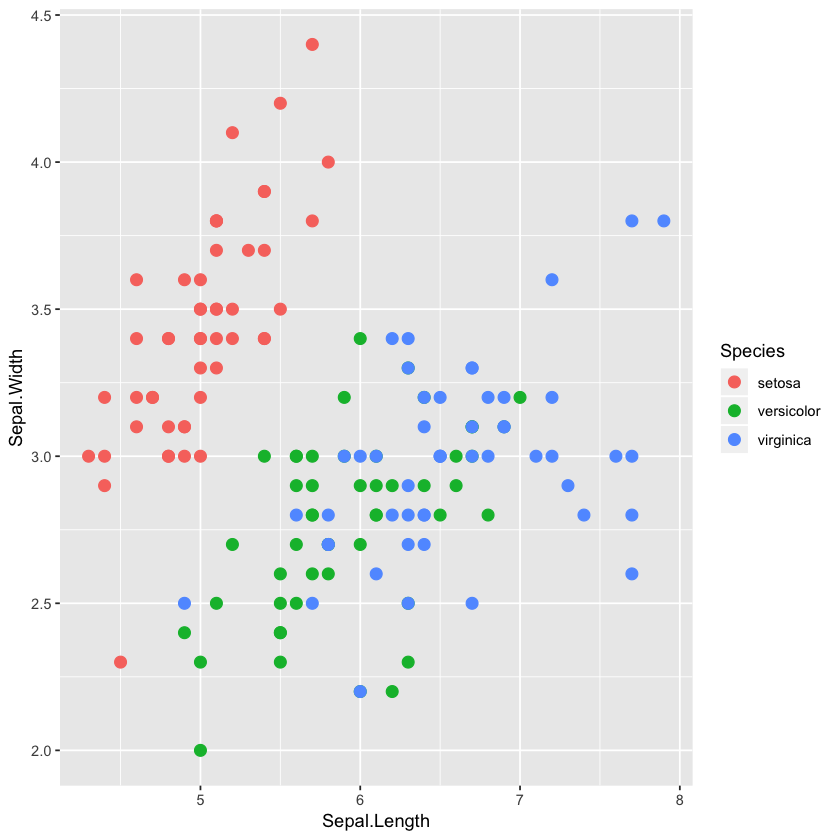

In [2]:
iris %>%
ggplot(
  mapping = aes(
    x = Sepal.Length, 
    y = Sepal.Width)
  ) + 
  geom_point(size=3, aes(color=Species)
)

`ggplot()` starts by creating a coordinate system that you can add layers to.

The coordinate system can be changed after the graph is initiated.

These layers are created by geometry functions.

For example, geom_point creates a point-based visualization.

There are many geom_ functions, and they can be layered on top of each other:

- `geom_point()`
- `geom_bar()`
- `geom_histogram()`
- `geom_boxplot()`

etc.

Here we have a plot with two layers. The second layer is created by a stat function, which is similar to geom, but applies a statistical transformation to the data.

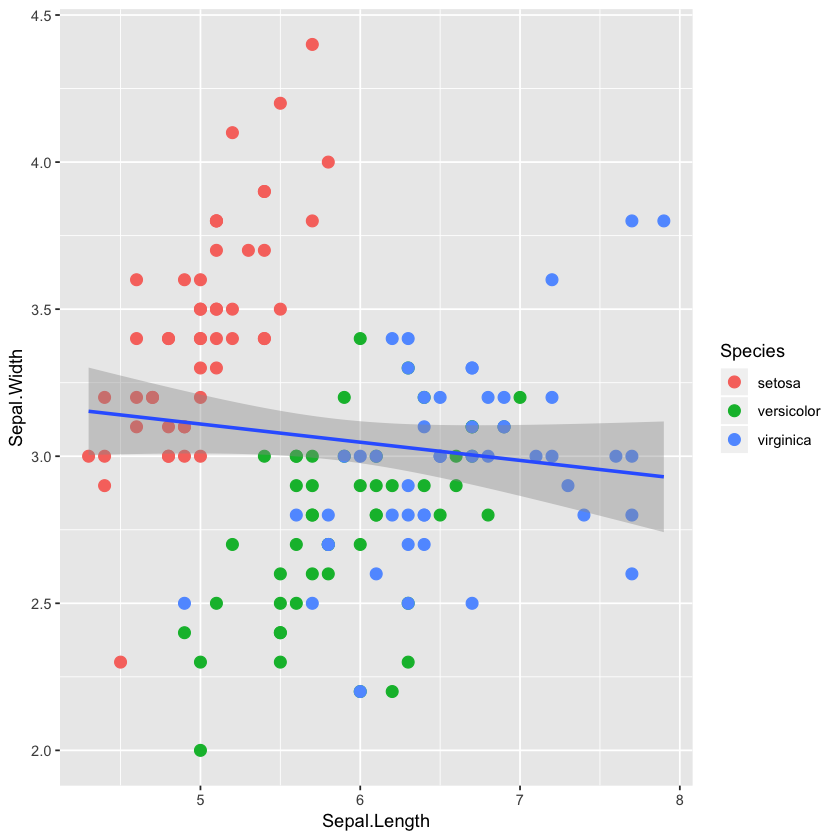

In [3]:
iris %>%
ggplot(aes(
  x = Sepal.Length, 
  y = Sepal.Width)) + 
  geom_point(size=3, aes(color=Species)) + 
  stat_smooth(method = lm)

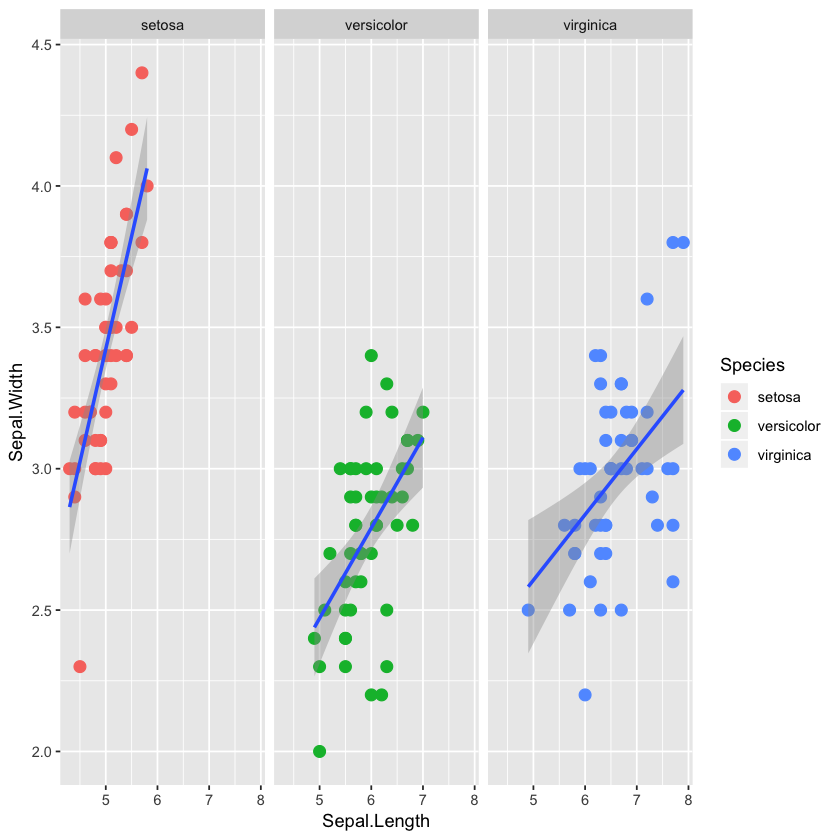

In [4]:
iris %>%
ggplot(aes(x = Sepal.Length, y = Sepal.Width)) + 
  geom_point(size=3, aes(color=Species)) + 
  stat_smooth(method = lm) +
  facet_wrap(facets = vars(Species))

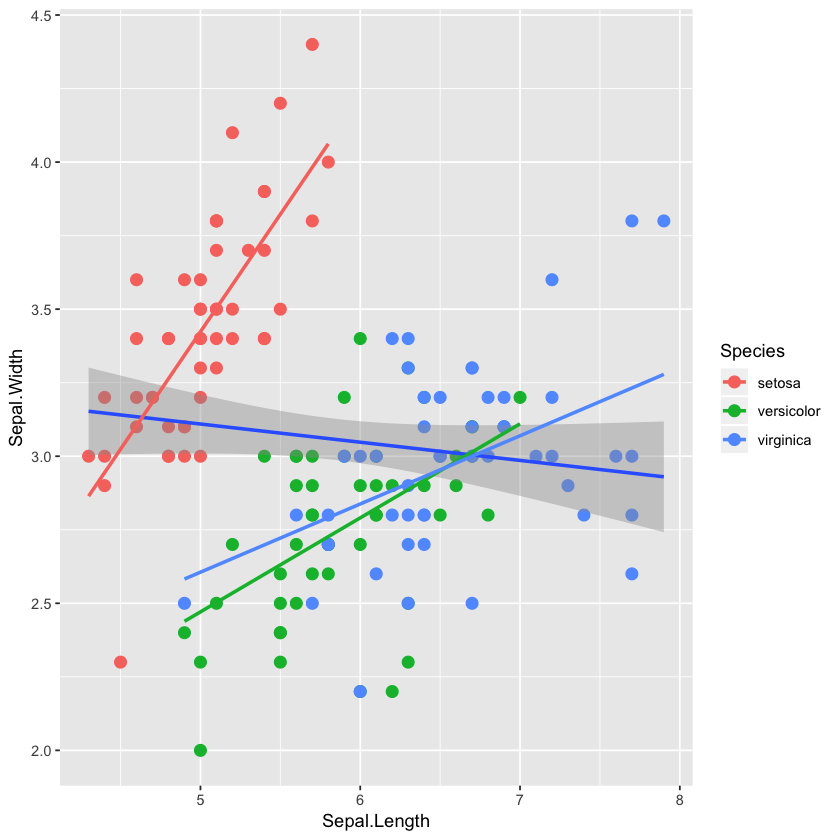

In [5]:
iris %>%
  ggplot(aes(
    x = Sepal.Length, 
    y = Sepal.Width)) + 
    geom_point(size=3, aes(color=Species)) + 
    stat_smooth(method = lm) +
    stat_smooth(method = lm, se=FALSE, aes(color=Species))

## Examples

In [6]:
diamonds %>%
   head()

carat,cut,color,clarity,depth,table,price,x,y,z
0.23,Ideal,E,SI2,61.5,55,326,3.95,3.98,2.43
0.21,Premium,E,SI1,59.8,61,326,3.89,3.84,2.31
0.23,Good,E,VS1,56.9,65,327,4.05,4.07,2.31
0.29,Premium,I,VS2,62.4,58,334,4.20,4.23,2.63
0.31,Good,J,SI2,63.3,58,335,4.34,4.35,2.75
0.24,Very Good,J,VVS2,62.8,57,336,3.94,3.96,2.48


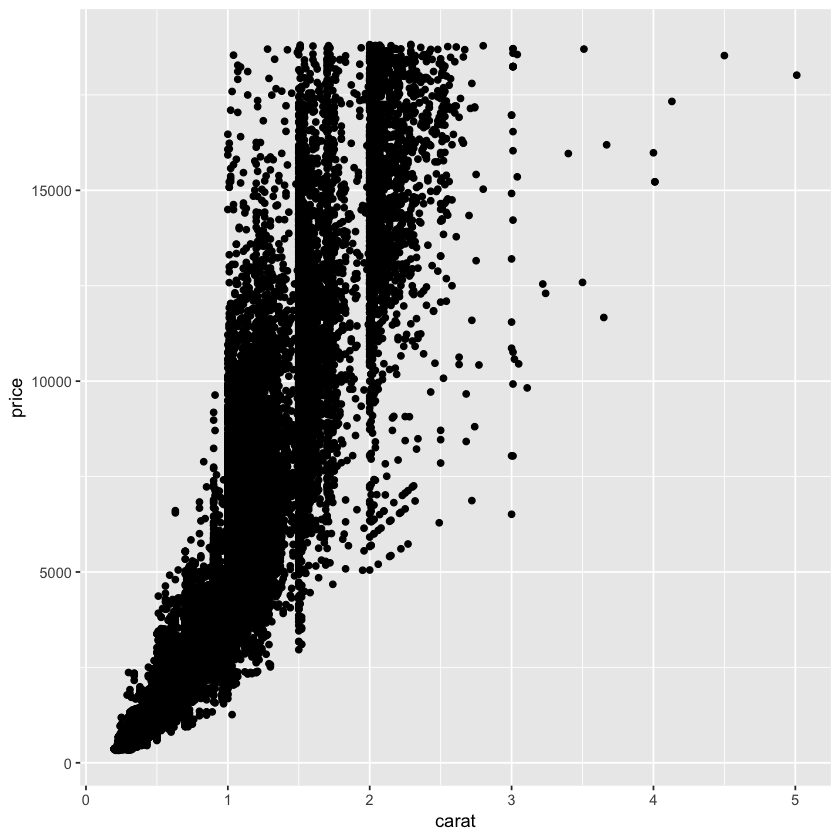

In [7]:
diamonds %>%
    ggplot(aes(x=carat, y=price)) + 
    geom_point()

Here’s another way to construct a graphic. By assigning it a variable, we can keep adding to it and showing out work.

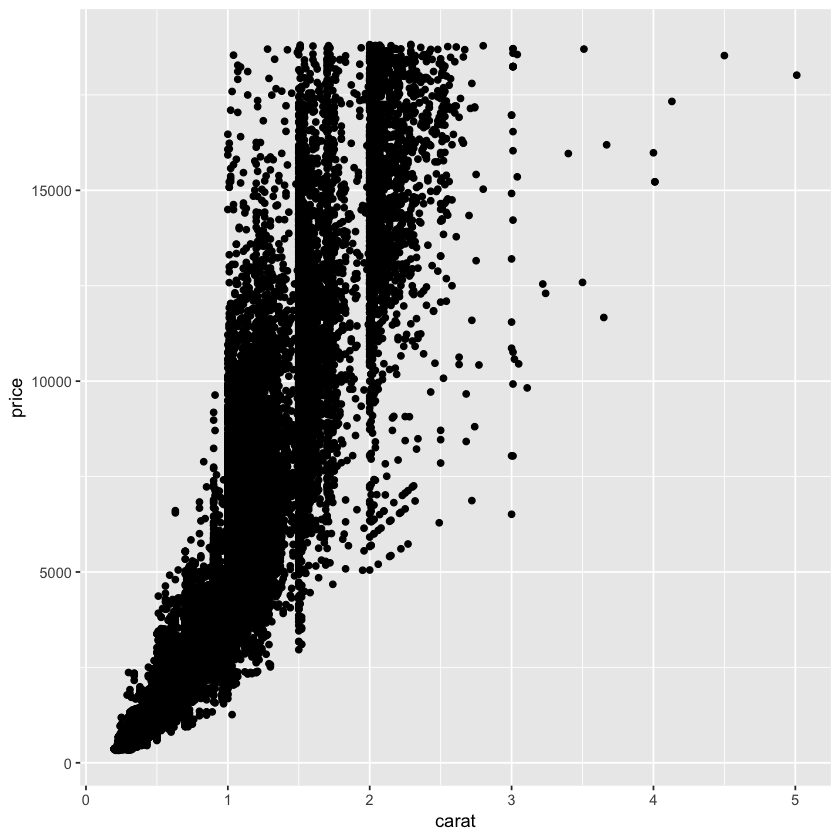

In [8]:
gg <- ggplot(diamonds, aes(x=carat, y=price)) 
gg + geom_point()

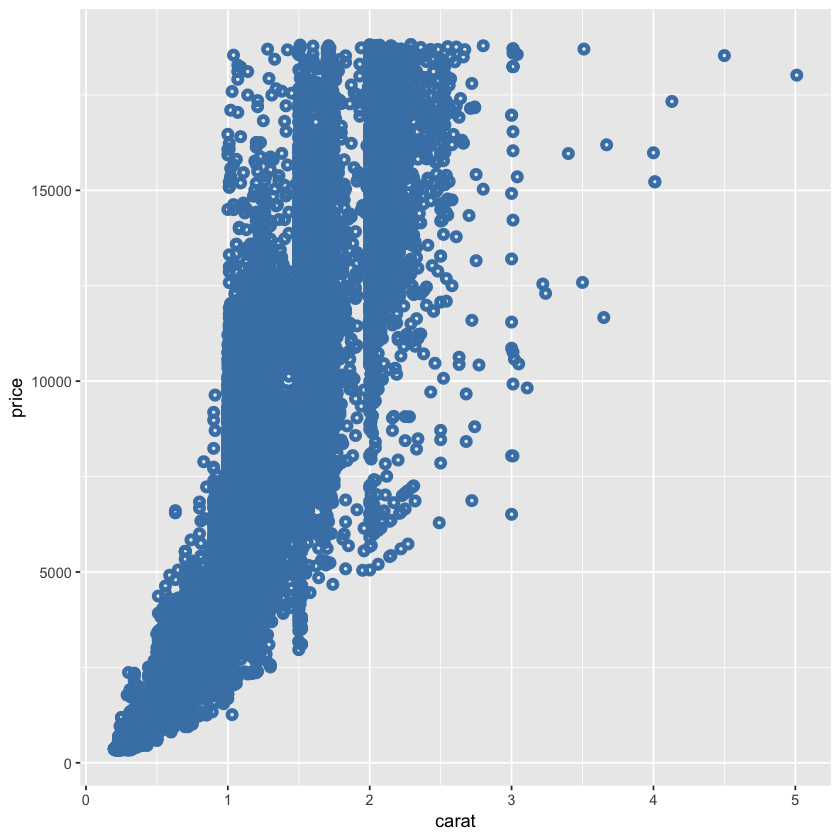

In [9]:
gg + geom_point(
  size=1, 
  shape=1, 
  color="steelblue", 
  stroke=2
)  

Warning message:
"Using shapes for an ordinal variable is not advised"

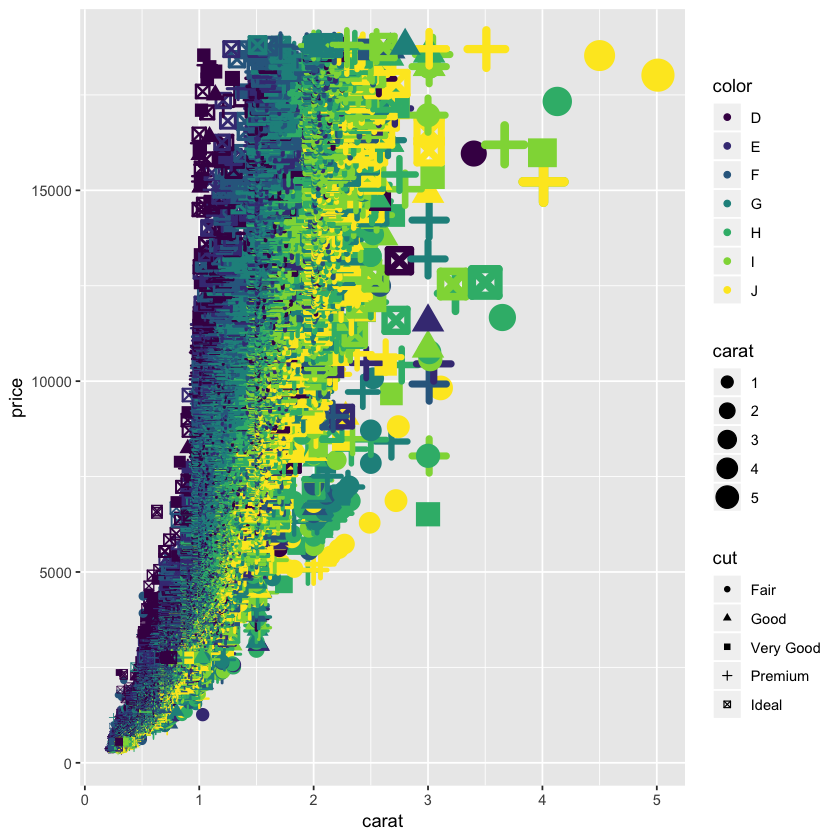

In [10]:
gg + geom_point(aes(
  size=carat, 
  shape=cut, 
  color=color, 
  stroke=carat))

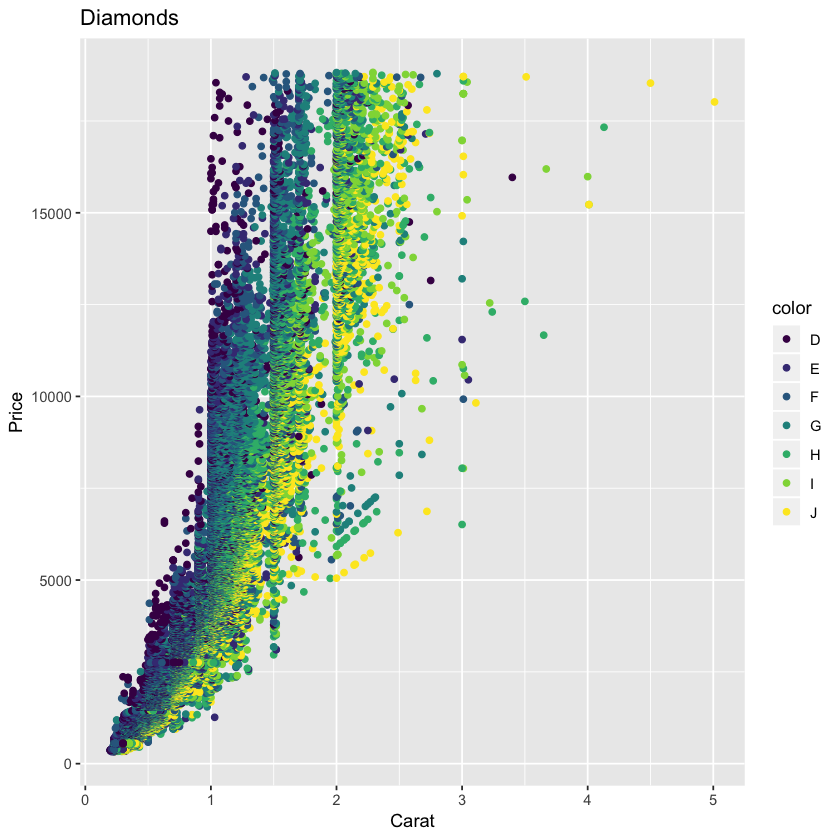

In [11]:
gg1 <- gg + geom_point(aes(color=color))
gg2 <- gg1 + labs(title="Diamonds", x="Carat", y="Price") 
gg2

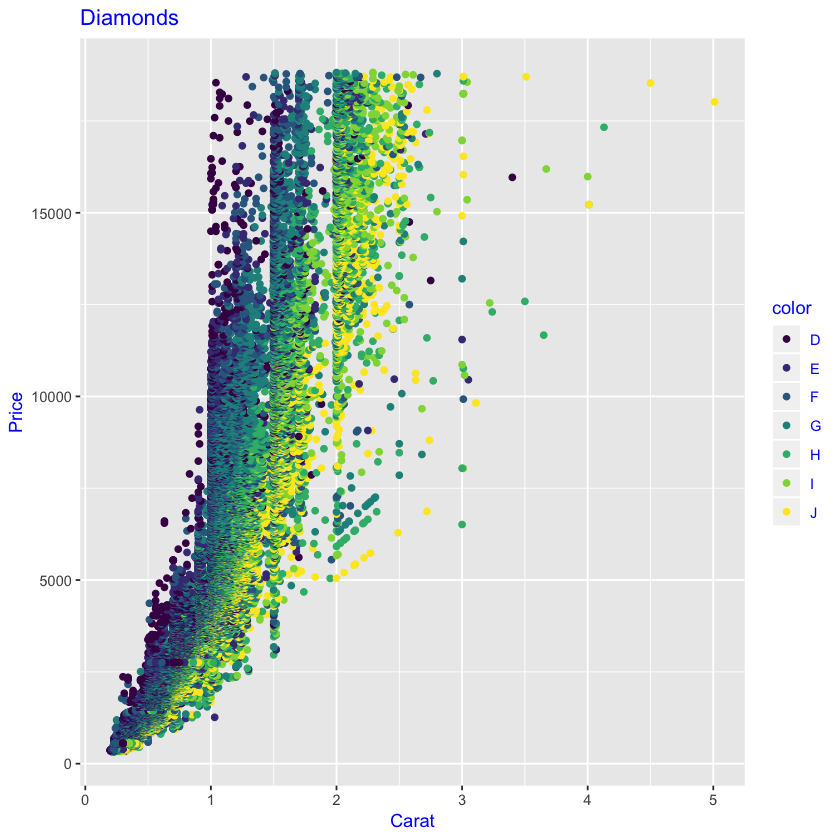

In [12]:
gg2 + theme(text=element_text(color="blue"))  # all text turns blue.

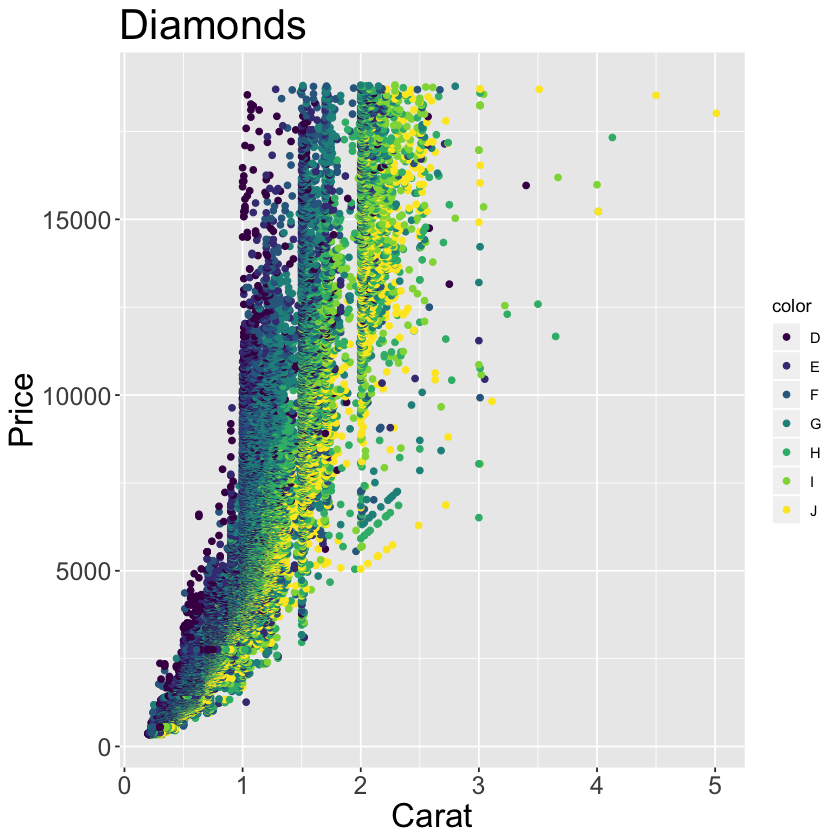

In [13]:
gg3 <- gg2 + 
  theme(plot.title=element_text(size=25), 
        axis.title.x=element_text(size=20),
        axis.title.y=element_text(size=20),
        axis.text.x=element_text(size=15),
        axis.text.y=element_text(size=15))
gg3

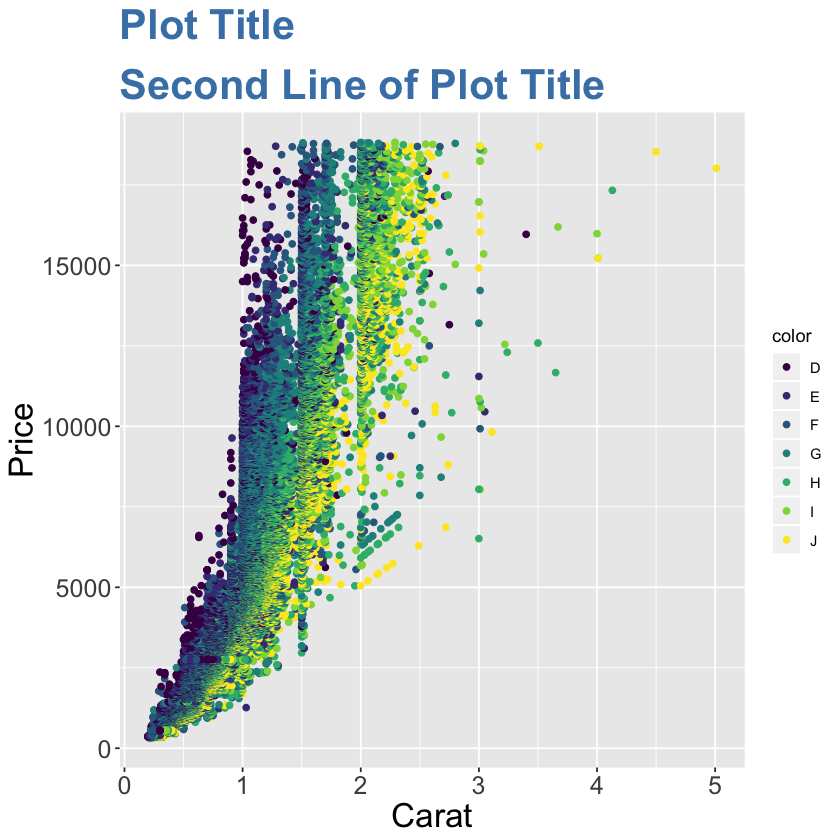

In [14]:
gg3 + 
  labs(title = "Plot Title\nSecond Line of Plot Title") +
  theme(plot.title = element_text(
    face="bold", 
    color="steelblue", 
    lineheight=1.2)
  )

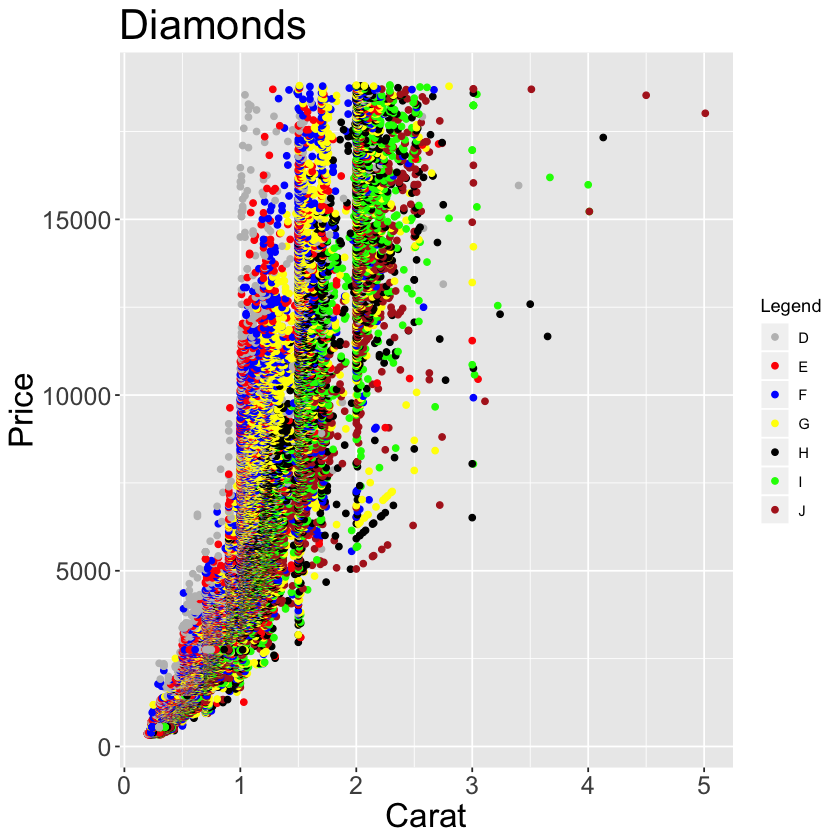

In [15]:
gg3 + scale_colour_manual(
  name='Legend', 
  values=c('D'='grey', 
           'E'='red', 
           'F'='blue', 
           'G'='yellow', 
           'H'='black', 
           'I'='green', 
           'J'='firebrick'))

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'


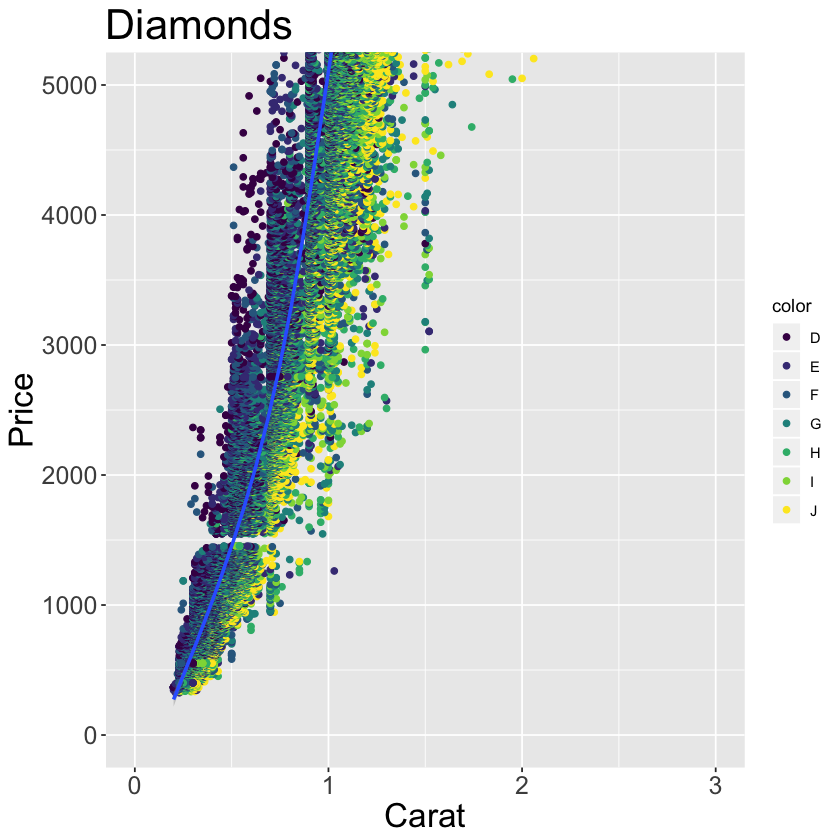

In [16]:
gg3 + 
    coord_cartesian(xlim=c(0,3), ylim=c(0, 5000)) + 
    geom_smooth()  # zoom in

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'
Warning message:
"Removed 14714 rows containing non-finite values (stat_smooth)."Warning message:
"Removed 14714 rows containing missing values (geom_point)."

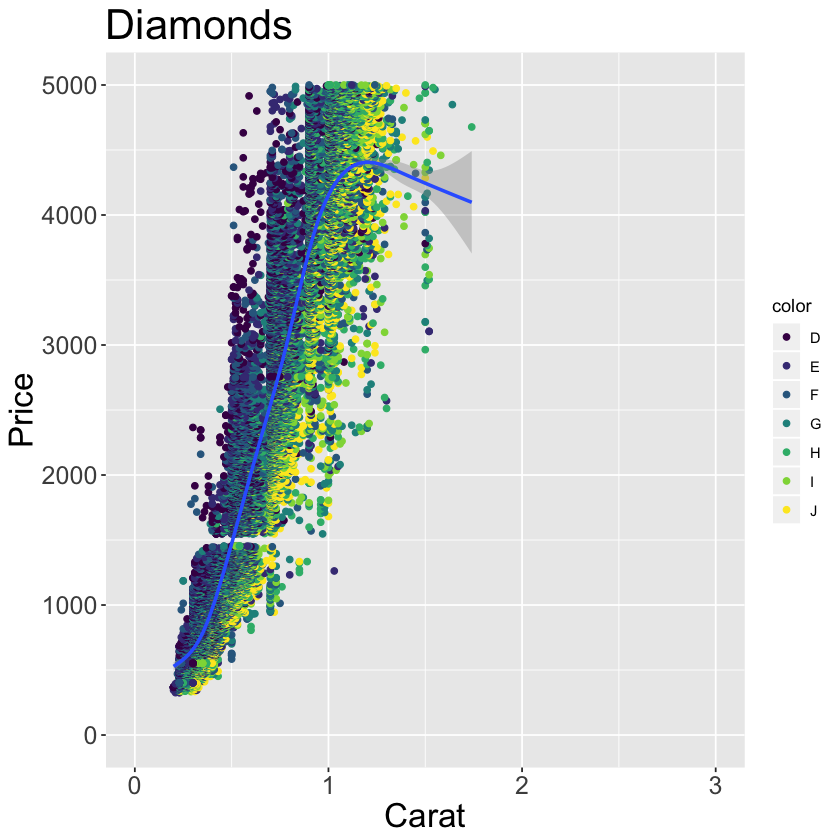

In [17]:
gg3 + 
    xlim(c(0,3)) + 
    ylim(c(0, 5000)) + 
    geom_smooth()  # deletes the points 

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'
Warning message:
"Removed 14714 rows containing non-finite values (stat_smooth)."Warning message:
"Removed 14714 rows containing missing values (geom_point)."

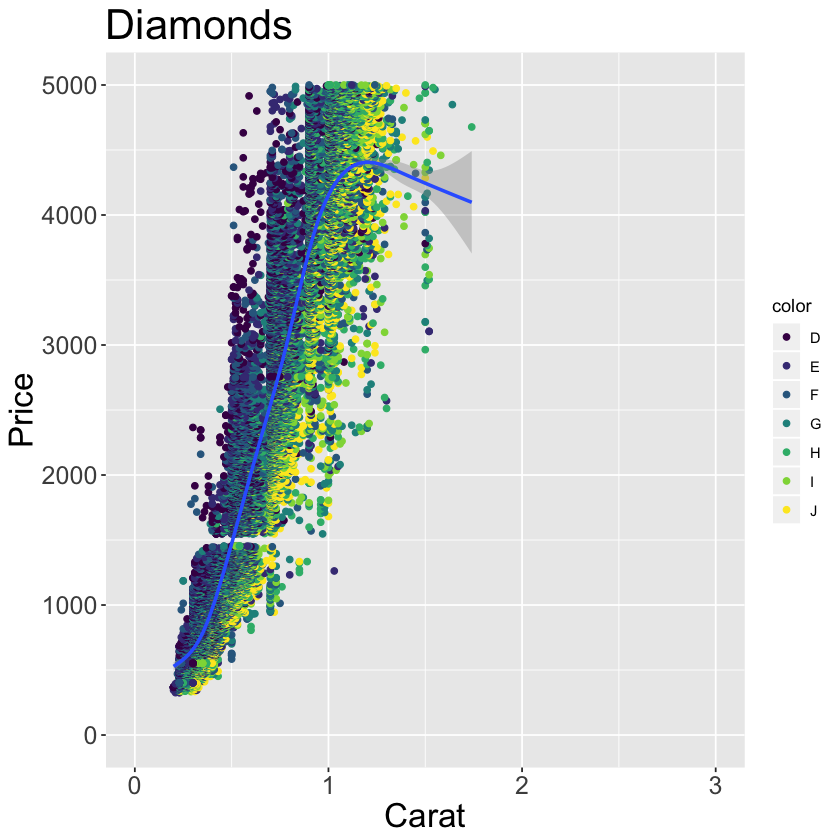

In [18]:
gg3 + scale_x_continuous(limits=c(0,3)) + 
  scale_y_continuous(limits=c(0, 5000)) +
  geom_smooth()  # deletes the points outside limits

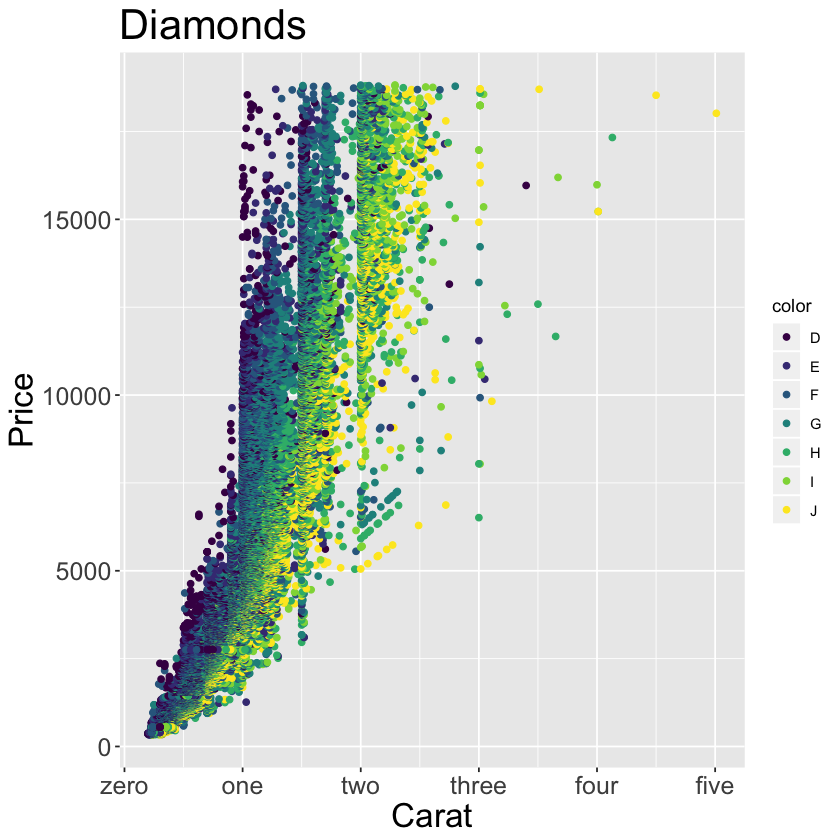

In [19]:
gg3 + scale_x_continuous(
  labels=c("zero", "one", "two", "three", "four", "five")) 

In [20]:
scale_y_continuous(breaks=seq(0, 20000, 4000))  # if Y is continuous, if X is a factor

<ScaleContinuousPosition>
 Range:  
 Limits:    0 --    1

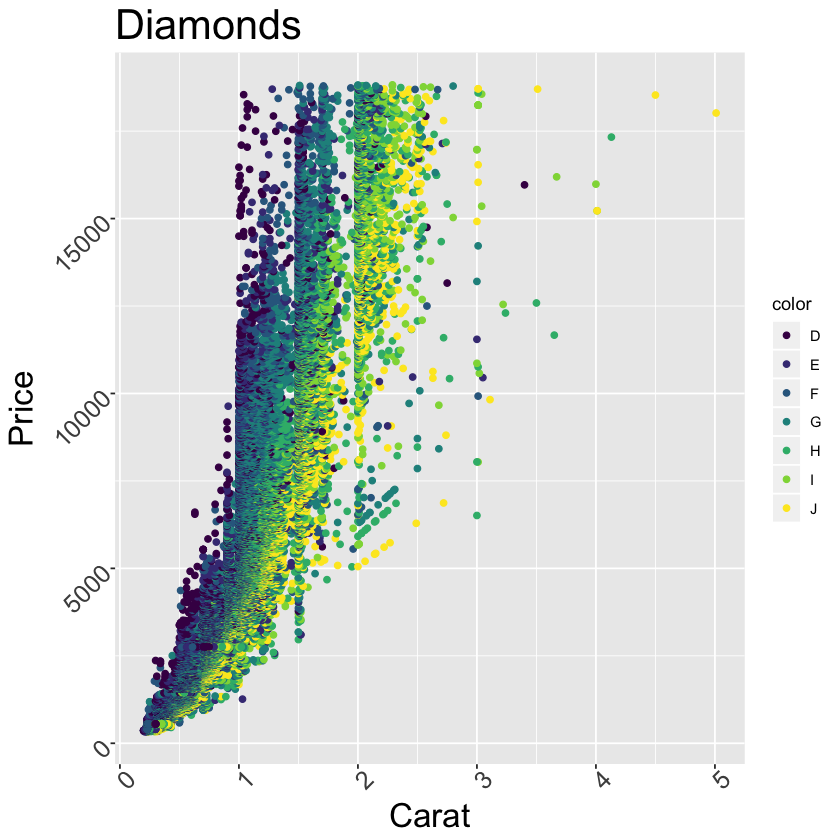

In [21]:
gg3 + theme(axis.text.x=element_text(angle=45), axis.text.y=element_text(angle=45))

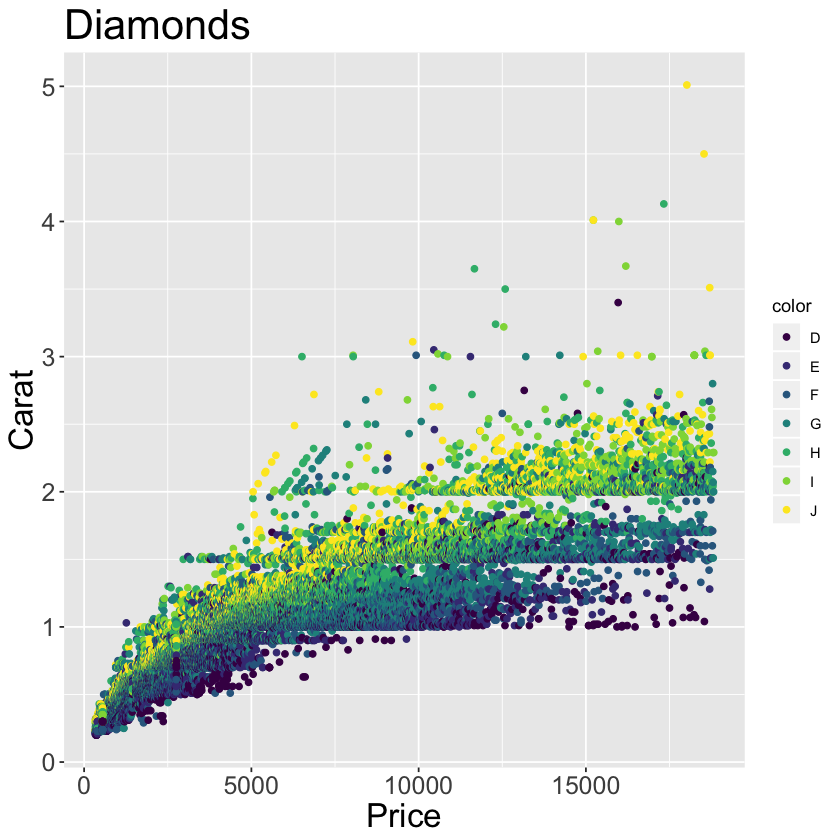

In [22]:
gg3 + coord_flip()  # flips X and Y axis.

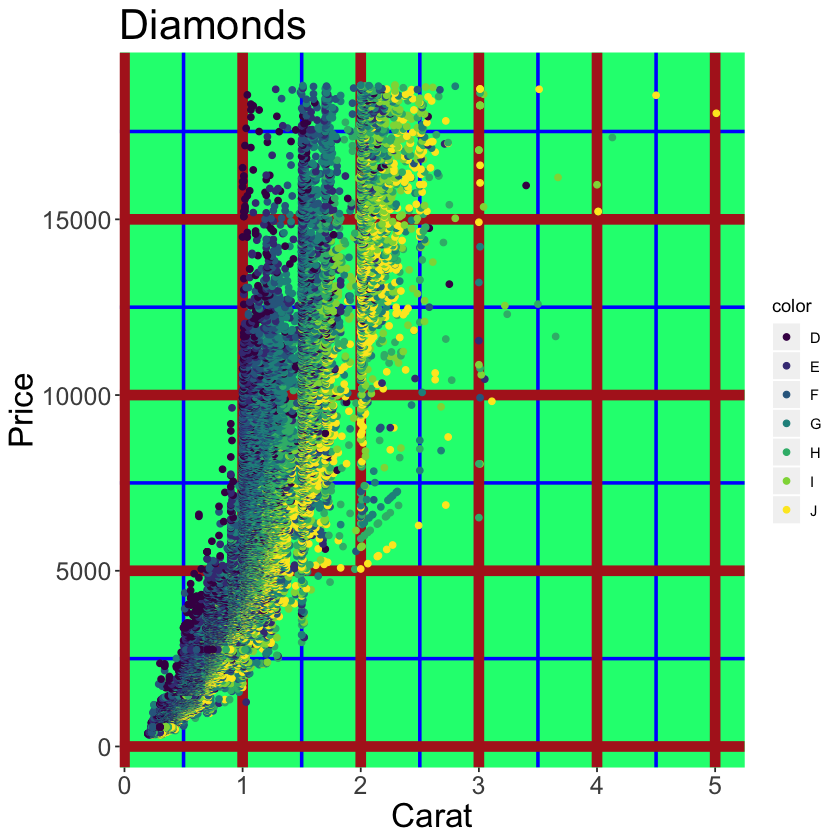

In [23]:
gg3 + theme(panel.background = element_rect(fill = 'springgreen'),
  panel.grid.major = element_line(colour = "firebrick", size=3),
  panel.grid.minor = element_line(colour = "blue", size=1))

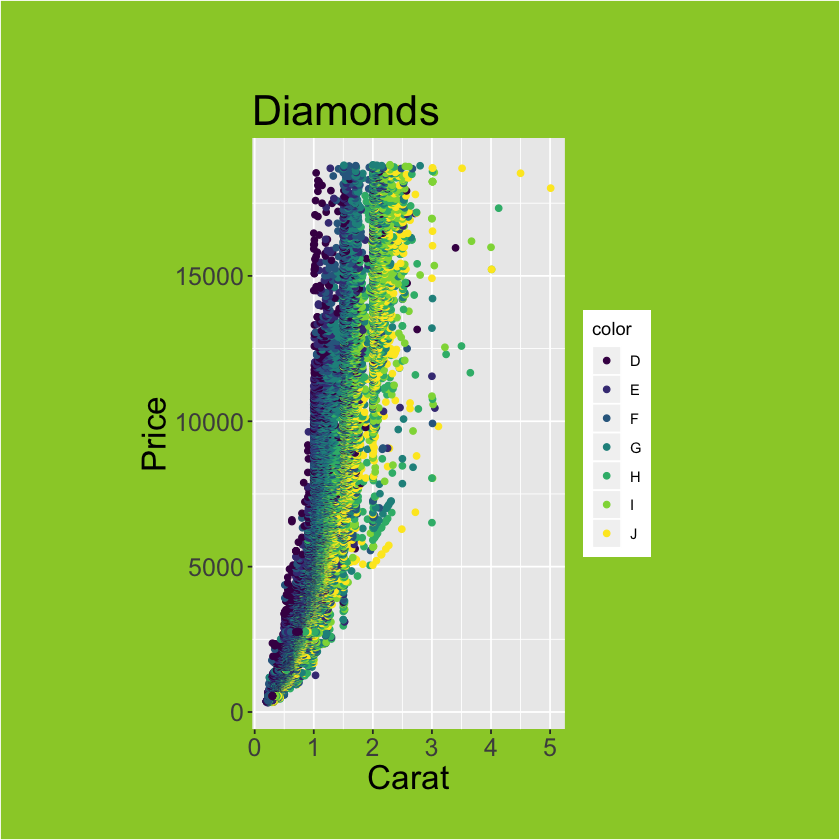

In [24]:
gg3 + 
    theme(
        plot.background = element_rect(fill="yellowgreen"), 
        plot.margin = unit(c(2, 4, 1, 3), "cm")) # top, right, bottom, left

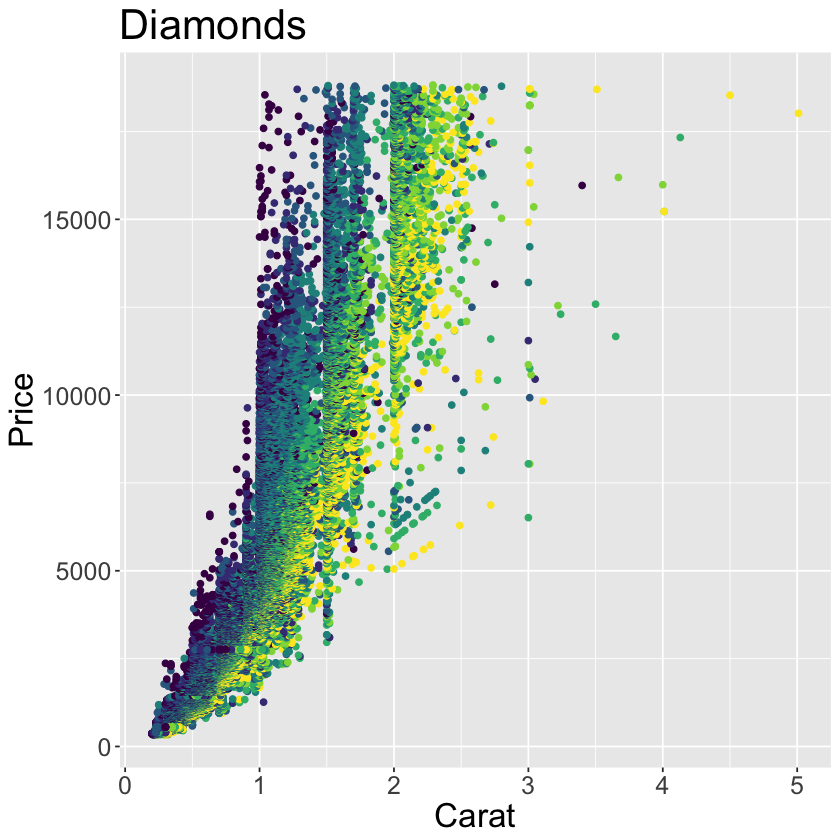

In [25]:
gg3 + 
    theme(legend.position="none")  # hides the legend

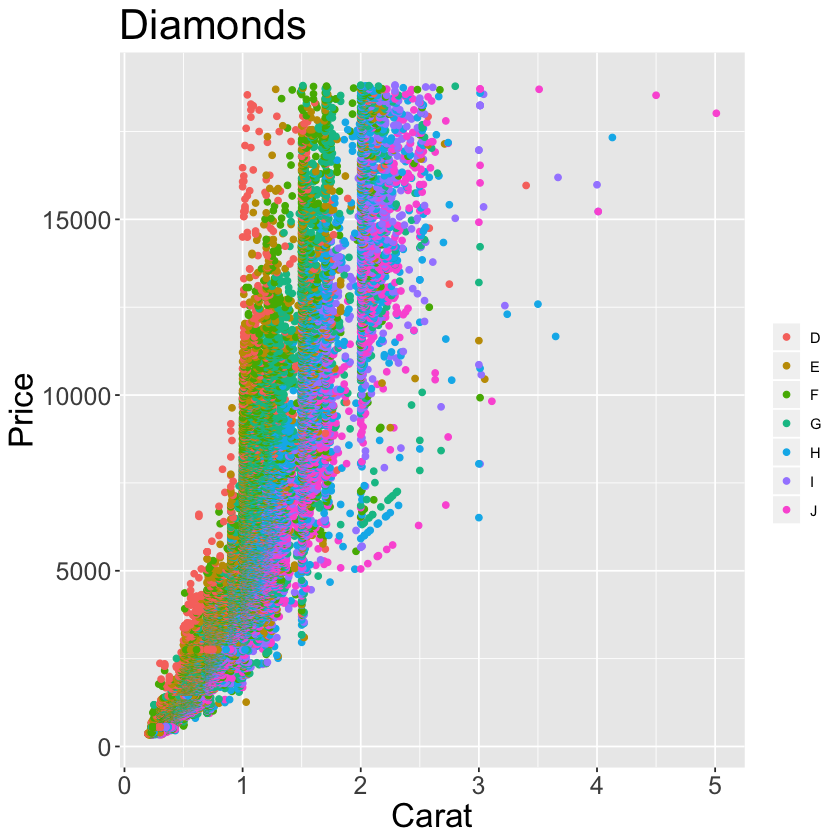

In [26]:
gg3 + 
    scale_color_discrete(name="")  # Remove legend title (method1)

In [27]:
# Remove legend title (method)
p1 <- gg3 + theme(legend.title=element_blank())  

# Change legend title
p2 <- gg3 + scale_color_discrete(name="Diamonds")  

In [28]:
install.packages("gridExtra")

Updating HTML index of packages in '.Library'
Making 'packages.html' ... done


In [29]:
library(gridExtra)


Attaching package: 'gridExtra'

The following object is masked from 'package:dplyr':

    combine



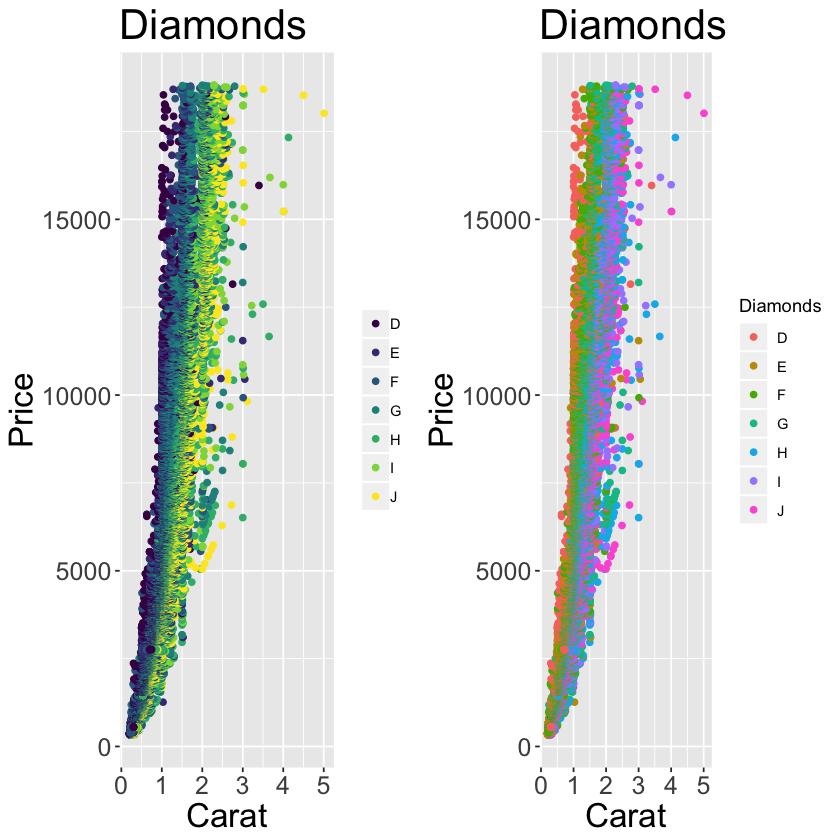

In [30]:
grid.arrange(p1, p2, ncol=2)  # arrange

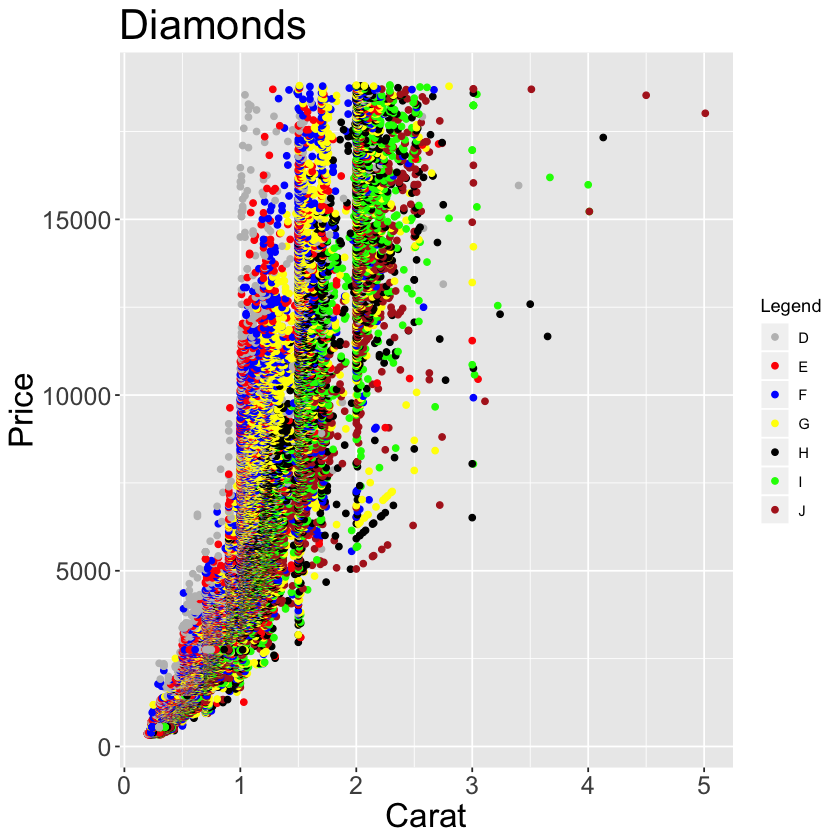

In [31]:
gg3 + scale_colour_manual(name='Legend', values=c('D'='grey', 'E'='red', 'F'='blue', 'G'='yellow', 'H'='black', 'I'='green', 'J'='firebrick'))

In [32]:
p1 <- gg3 + theme(legend.position="top")  # top / bottom / left / right

In [33]:
p2 <- gg3 + theme(legend.justification=c(1,0), legend.position=c(1,0))  # legend justification is the anchor point on the legend, considering the bottom left of legend as (0,0)

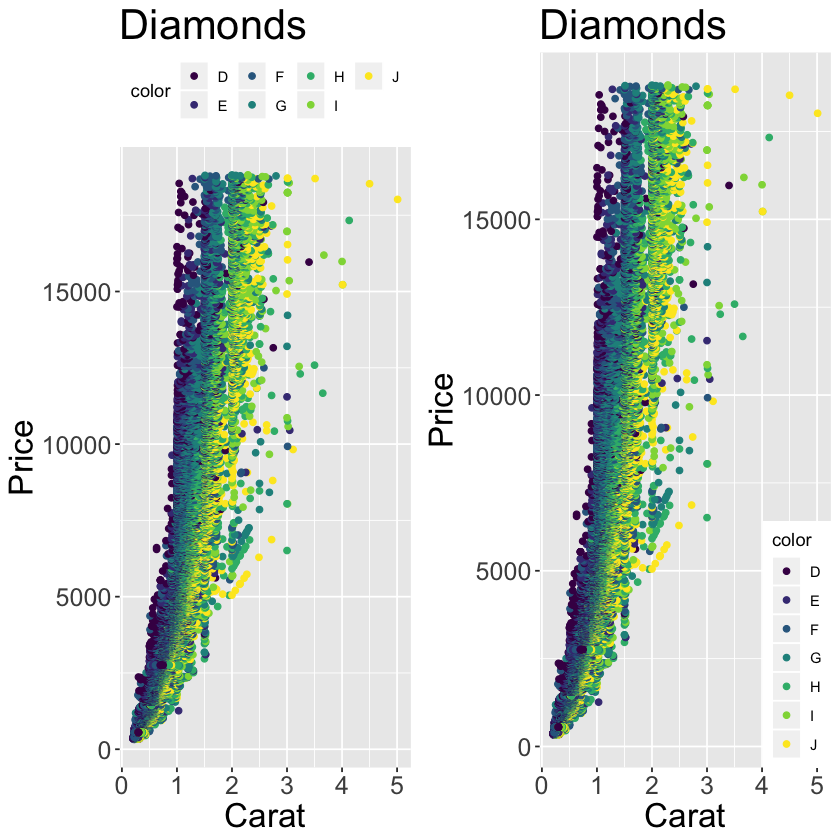

In [34]:
gridExtra::grid.arrange(p1, p2, ncol=2)

In [35]:
# df$newLegendColumn <- factor(df$legendcolumn, levels=c(new_order_of_legend_items), ordered = TRUE) 

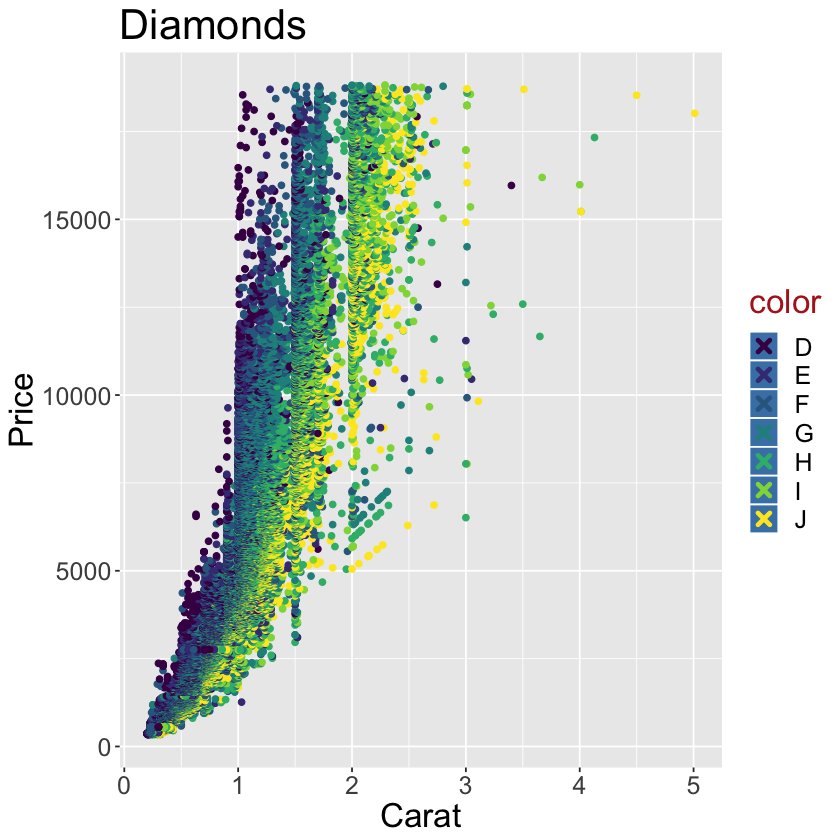

In [36]:
gg3 + 
    theme(
        legend.title = element_text(size=20, 
        color = "firebrick"), 
        legend.text = element_text(size=15), 
        legend.key=element_rect(fill='steelblue')) + 
    guides(
        colour = guide_legend(
            override.aes = list(size=2, shape=4, stroke=2)))  # legend title color and size, box color, symbol color, size and shape.

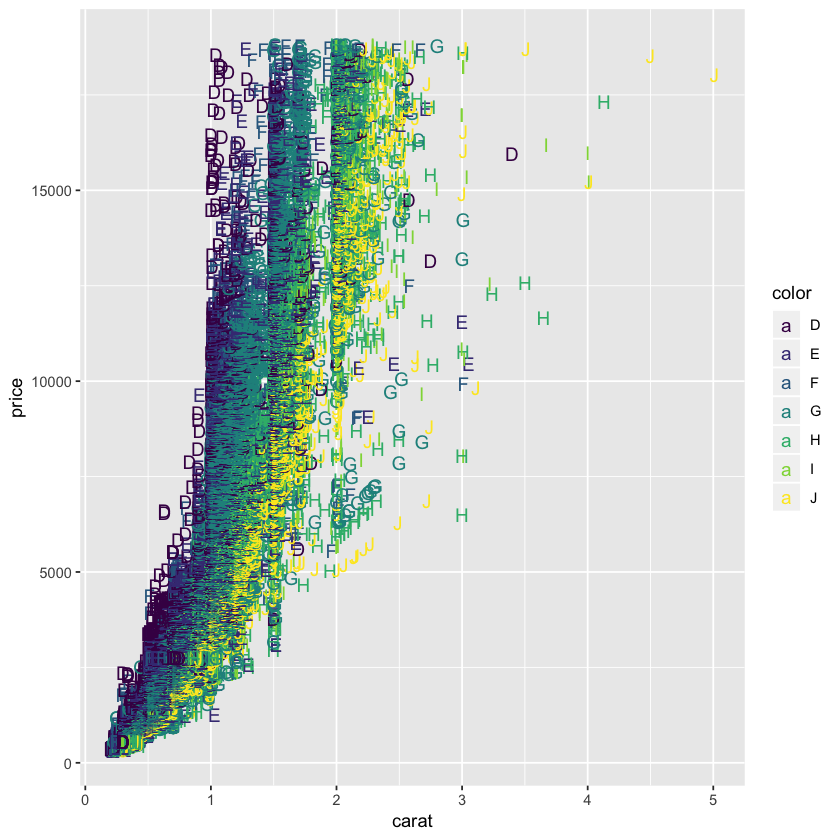

In [37]:
# Not Run: gg + geom_text(aes(xcol, ycol, label=round(labelCol), size=3)) 
# general format 
gg + geom_text(aes(label=color, color=color), size=4)

In [38]:
library(grid) 

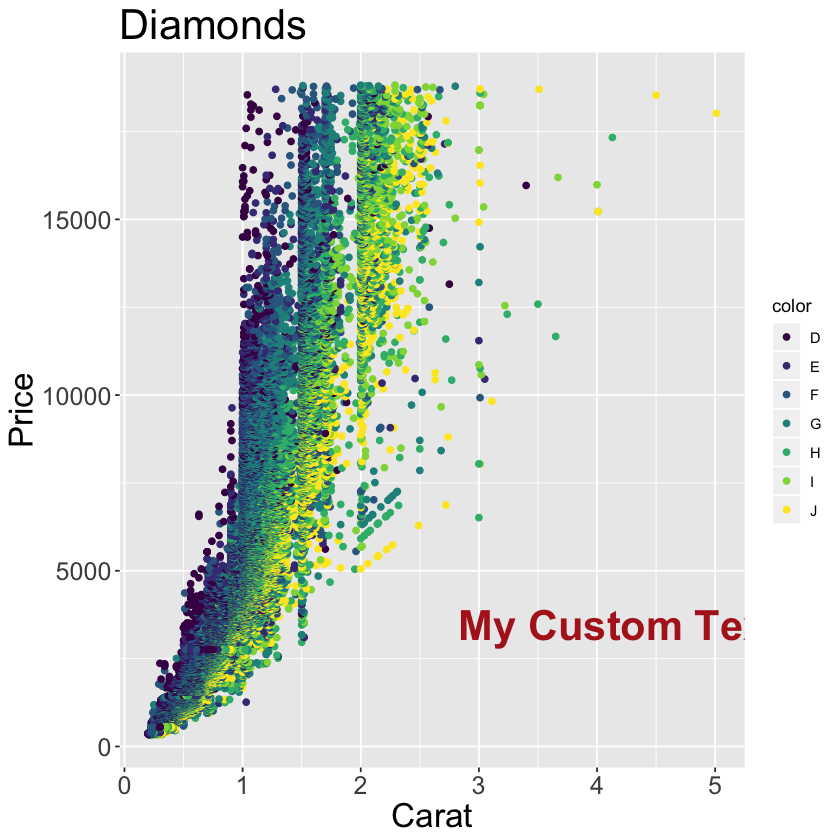

In [39]:
my_grob = grobTree(textGrob("My Custom Text", x=0.8, y=0.2, 
                            gp=gpar(col="firebrick", fontsize=25, fontface="bold"))) 

gg3 + annotation_custom(my_grob)

In [40]:
p1 <- gg1 + facet_grid(color ~ cut) # arrange in a grid. More space for plots. Free X and Y axis scales

In [41]:
p2 <- gg1 + facet_wrap(color ~ cut, scales="free") # free the x and yaxis scales. 

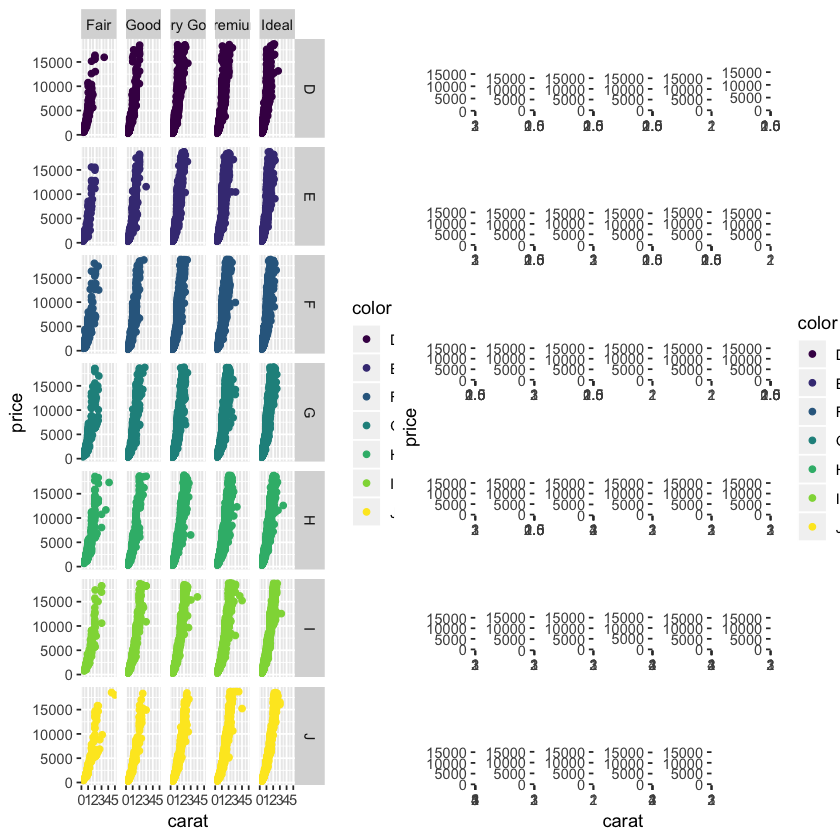

In [42]:
# library(gridExtra) 
grid.arrange(p1, p2, ncol=2)

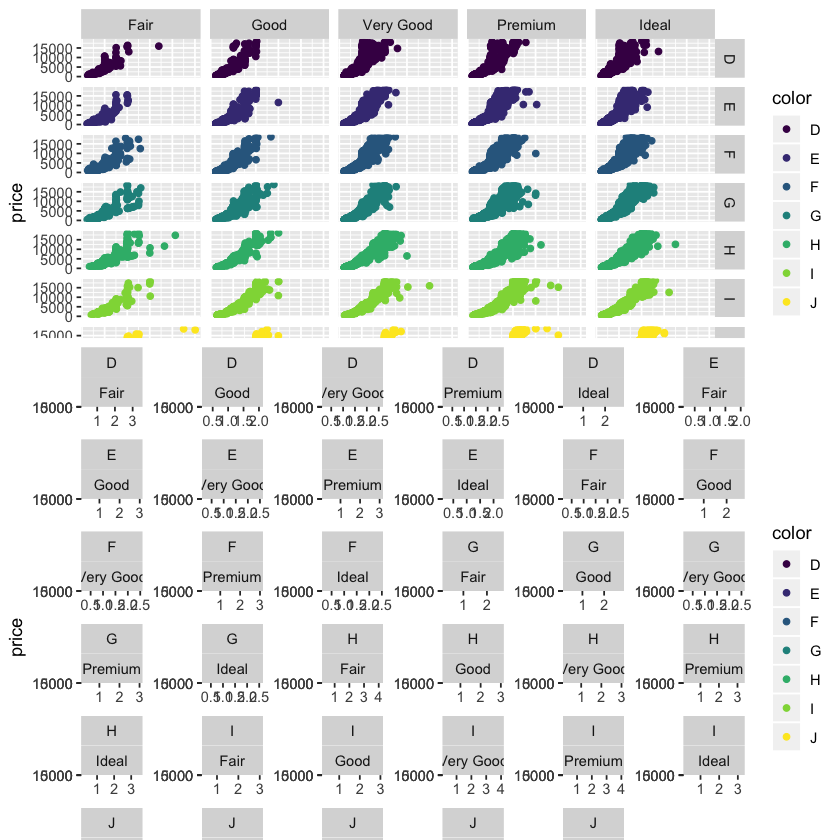

In [43]:
# library(gridExtra) 
grid.arrange(p1, p2, nrow=2)